In [1]:
import scanpy as sc

In [2]:
adata_path = "/mnt/home/bowmand8/adata_healthy_diseased_nucseq.h5ad"

In [3]:
adata = sc.read_h5ad(adata_path)

adata.obs.columns


Index(['Condition', 'Sex', 'Age', 'log10GenesPerUMI_injured',
       'seurat_clusters_injured', 'CellType_injured',
       'cell_type_final_injured', 'log10GenesPerUMI_healthy',
       'seurat_clusters_healthy', 'CellType_healthy',
       'cell_type_final_healthy', 'batch', 'n_counts', 'log_counts', 'n_genes',
       'sample_id', 'organism_ontology_term_id', 'donor_id',
       'development_stage_ontology_term_id', 'sex_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id', 'disease_ontology_term_id',
       'tissue_type', 'tissue_ontology_term_id', 'cell_type_ontology_term_id',
       'assay_ontology_term_id', 'suspension_type'],
      dtype='object')

In [ ]:
adata_sample = adata[adata.obs["sample_id"] == "AM031"]

In [ ]:
CTRL_CONDITION = "Healthy"
import numpy as np

adata_sample.obs["cell_type"] = np.where(
    adata_sample.obs["Condition"] == CTRL_CONDITION,
    adata_sample.obs["cell_type_final_healthy"].astype(str),
    adata_sample.obs["cell_type_final_injured"].astype(str),
)

/tmp/ipykernel_1307604/4062565698.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata_sample.obs['cell_type'] = np.where(


In [11]:
adata_sample.obs["cell_type"].value_counts()

cell_type
Central_Hep      1144
IJ_1_Hep          796
IJ_2_Hep          675
Portal_Hep        475
LSEC              332
HSC               248
Mac               131
Immune Cells      122
Cholangiocyte      92
Name: count, dtype: int64

--- Reclustering Hepatocyte ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


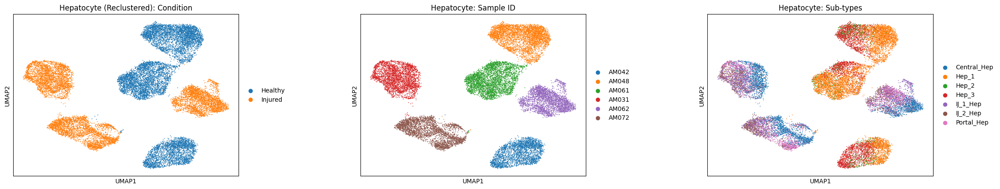

--- Reclustering HSC ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


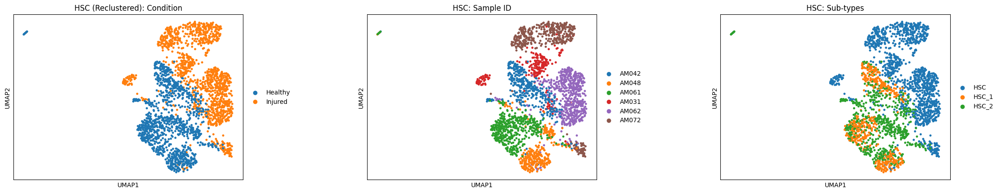

--- Reclustering LSEC ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


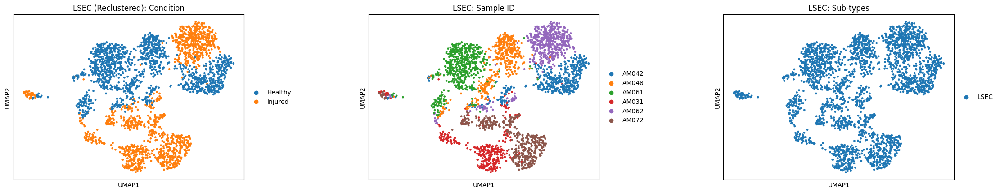

--- Reclustering Macrophage ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


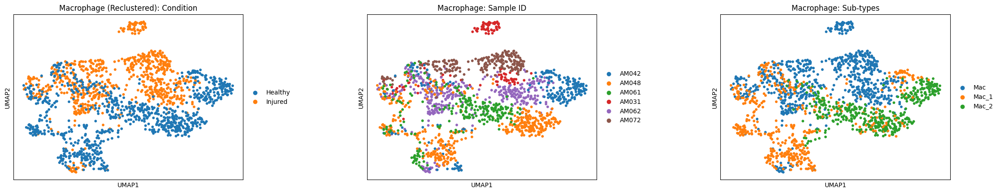

--- Reclustering Cholangiocyte ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


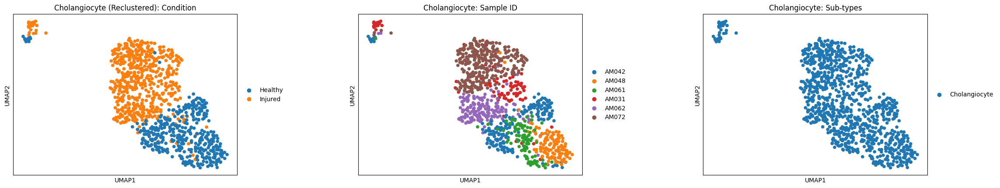

--- Reclustering Immune Cells ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:384: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = x_pca


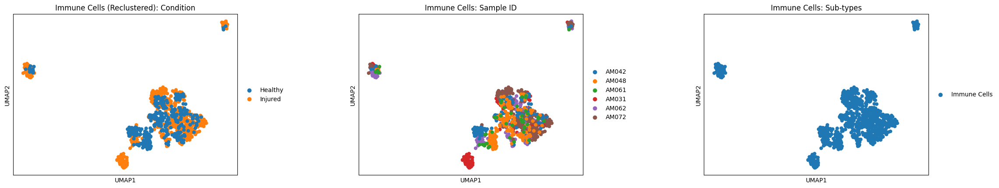

In [ ]:
import scanpy as sc
import pandas as pd
import numpy as np

# 1. Combine the two columns into one unified 'detailed_cell_type' column
# This assumes a cell has a value in one column and NaN/null in the other.
adata.obs["detailed_cell_type"] = (
    adata.obs["cell_type_final_healthy"]
    .astype("object")
    .fillna(adata.obs["cell_type_final_injured"].astype("object"))
    .astype("category")
)

# 2. Create a 'condition' column based on which original column had the annotation
# (If you already have a healthy/injured column, you can skip this step and use yours)
adata.obs["condition"] = [
    "Healthy" if pd.notna(x) else "Injured"
    for x in adata.obs["cell_type_final_healthy"]
]

# 3. Create a dictionary to map your specific sub-types to broad cell categories
cell_type_mapping = {
    # Hepatocytes
    "Hep_1": "Hepatocyte",
    "Hep_2": "Hepatocyte",
    "Hep_3": "Hepatocyte",
    "Central_Hep": "Hepatocyte",
    "IJ_1_Hep": "Hepatocyte",
    "Portal_Hep": "Hepatocyte",
    "IJ_2_Hep": "Hepatocyte",
    # Hepatic Stellate Cells (HSCs)
    "HSC_1": "HSC",
    "HSC_2": "HSC",
    "HSC": "HSC",
    # Macrophages
    "Mac_1": "Macrophage",
    "Mac_2": "Macrophage",
    "Mac": "Macrophage",
    # Other Lineages
    "LSEC": "LSEC",
    "Cholangiocyte": "Cholangiocyte",
    "Immune Cells": "Immune Cells",
}

# 4. Map the detailed types to their broad categories
adata.obs["broad_cell_type"] = adata.obs["detailed_cell_type"].map(cell_type_mapping)

# 5. Loop through each broad category, subset the data, and plot
# broad_categories = adata.obs["broad_cell_type"].dropna().unique()

# for cell_type in broad_categories:
#     # Subset the AnnData object for just this broad cell type
#     subset_adata = adata[adata.obs["broad_cell_type"] == cell_type]

#     # Plot UMAPs side-by-side: Condition, Sample ID, and Detailed Sub-types
#     sc.pl.umap(
#         subset_adata,
#         color=["condition", "sample_id", "detailed_cell_type"],
#         title=[
#             f"{cell_type}: Healthy vs Injured",
#             f"{cell_type}: Samples",
#             f"{cell_type}: Sub-types",
#         ],
#         wspace=0.4,  # Adds a bit of width space between plots so legends don't overlap
#         show=True,
#     )


# Assuming 'broad_cell_type', 'condition', and 'detailed_cell_type'
# are already set up in adata.obs from the previous steps.

broad_categories = adata.obs["broad_cell_type"].dropna().unique()

for cell_type in broad_categories:
    print(f"--- Reclustering {cell_type} ---")

    # 1. Create a true copy of the subset to avoid modifying the global AnnData
    subset_adata = adata[adata.obs["broad_cell_type"] == cell_type].copy()

    # Optional: You can recalculate highly variable genes strictly for this lineage here.
    # If you skip this, it will just use the global highly variable genes for the PCA.
    sc.pp.highly_variable_genes(subset_adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
    subset_adata = subset_adata[:, subset_adata.var.highly_variable]

    # 2. Recompute the manifold
    sc.tl.pca(subset_adata, svd_solver="arpack")
    sc.pp.neighbors(subset_adata, n_neighbors=15, n_pcs=30)  # Adjust n_pcs if needed
    sc.tl.umap(subset_adata)

    # 3. Plot the new subset-specific UMAP
    sc.pl.umap(
        subset_adata,
        color=["condition", "sample_id", "detailed_cell_type"],
        title=[
            f"{cell_type} (Reclustered): Condition",
            f"{cell_type}: Sample ID",
            f"{cell_type}: Sub-types",
        ],
        wspace=0.4,
        show=True,
    )


In [ ]:
adata.obs[["sample_id", "Condition"]].value_counts()

sample_id  Condition
AM048      Normal       5274
AM061      Normal       4950
AM062      Disease      4771
AM072      Disease      4692
AM031      Disease      4015
AM042      Normal       3990
Name: count, dtype: int64

--- Reclustering and Integrating Hepatocyte ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:51:59,544 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:51:59,545 - harmonypy - INFO -   Parameters:
2026-03-09 12:51:59,545 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:51:59,545 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:51:59,546 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:51:59,546 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:51:59,546 - harmonypy - INFO -     nclust: 100
2026-03-09 12:51:59,546 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:51:59,547 - harmonypy - INFO -     lamb

  -> Running Harmony for Hepatocyte...


2026-03-09 12:51:59,833 - harmonypy - INFO - KMeans initialization complete.
2026-03-09 12:51:59,840 - harmonypy - INFO - Iteration 1 of 10
2026-03-09 12:52:00,058 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:52:00,263 - harmonypy - INFO - Converged after 2 iterations


  -> Detected transposed Z_corr (shape (50, 19122)), correcting...


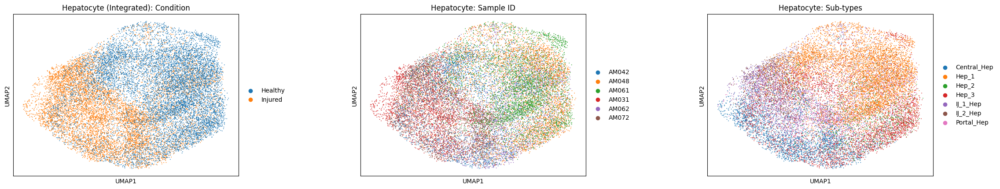

--- Reclustering and Integrating HSC ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:52:09,245 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:52:09,250 - harmonypy - INFO -   Parameters:
2026-03-09 12:52:09,254 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:52:09,258 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:52:09,260 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:52:09,260 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:52:09,260 - harmonypy - INFO -     nclust: 81
2026-03-09 12:52:09,261 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:52:09,261 - harmonypy - INFO -     lamb:

  -> Running Harmony for HSC...


2026-03-09 12:52:09,534 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:52:09,709 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 12:52:09,957 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 12:52:10,392 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 12:52:10,775 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 12:52:11,122 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 12:52:11,432 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 12:52:11,576 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 12:52:11,684 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 12:52:11,799 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 2418)), correcting...


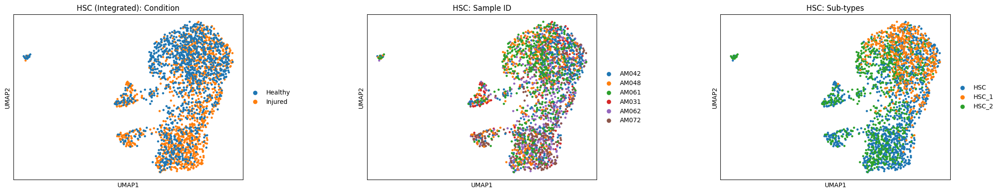

--- Reclustering and Integrating LSEC ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:52:15,794 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:52:15,795 - harmonypy - INFO -   Parameters:
2026-03-09 12:52:15,795 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:52:15,796 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:52:15,796 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:52:15,796 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:52:15,796 - harmonypy - INFO -     nclust: 87
2026-03-09 12:52:15,797 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:52:15,797 - harmonypy - INFO -     lamb:

  -> Running Harmony for LSEC...


2026-03-09 12:52:16,405 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:52:16,893 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 12:52:17,311 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 12:52:17,497 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 12:52:17,635 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 12:52:17,771 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 12:52:17,896 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 12:52:18,013 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 12:52:18,131 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 12:52:18,229 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 2620)), correcting...


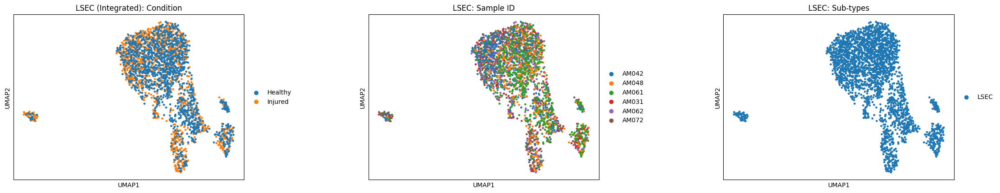

--- Reclustering and Integrating Macrophage ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:52:21,782 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:52:21,782 - harmonypy - INFO -   Parameters:
2026-03-09 12:52:21,783 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:52:21,783 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:52:21,784 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:52:21,784 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:52:21,784 - harmonypy - INFO -     nclust: 56
2026-03-09 12:52:21,784 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:52:21,785 - harmonypy - INFO -     lamb:

  -> Running Harmony for Macrophage...


2026-03-09 12:52:22,279 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:52:22,678 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 12:52:23,079 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 12:52:23,355 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 12:52:23,501 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 12:52:23,596 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 12:52:23,684 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 12:52:23,764 - harmonypy - INFO - Converged after 8 iterations


  -> Detected transposed Z_corr (shape (50, 1690)), correcting...


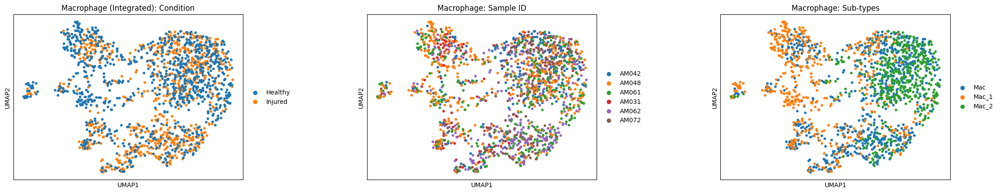

--- Reclustering and Integrating Cholangiocyte ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:52:26,375 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:52:26,376 - harmonypy - INFO -   Parameters:
2026-03-09 12:52:26,376 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:52:26,376 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:52:26,376 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:52:26,377 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:52:26,377 - harmonypy - INFO -     nclust: 33
2026-03-09 12:52:26,378 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:52:26,378 - harmonypy - INFO -     lamb:

  -> Running Harmony for Cholangiocyte...


2026-03-09 12:52:26,846 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:52:27,183 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 12:52:27,465 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 12:52:27,594 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 12:52:27,704 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 12:52:27,810 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 12:52:27,893 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 12:52:27,980 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 12:52:28,058 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 12:52:28,124 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 987)), correcting...


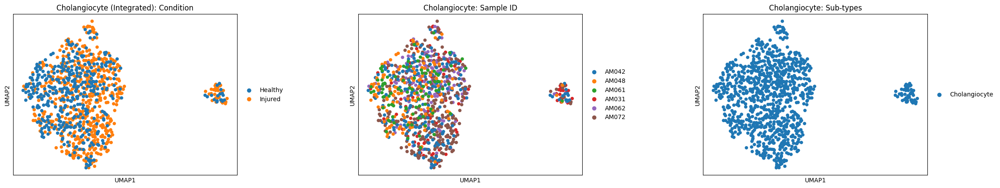

--- Reclustering and Integrating Immune Cells ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:52:29,917 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:52:29,922 - harmonypy - INFO -   Parameters:
2026-03-09 12:52:29,926 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:52:29,930 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:52:29,934 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:52:29,938 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:52:29,942 - harmonypy - INFO -     nclust: 28
2026-03-09 12:52:29,946 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:52:29,947 - harmonypy - INFO -     lamb:

  -> Running Harmony for Immune Cells...


2026-03-09 12:52:30,282 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:52:30,603 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 12:52:30,816 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 12:52:30,977 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 12:52:31,175 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 12:52:31,337 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 12:52:31,474 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 12:52:31,626 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 12:52:31,731 - harmonypy - INFO - Converged after 9 iterations


  -> Detected transposed Z_corr (shape (50, 855)), correcting...


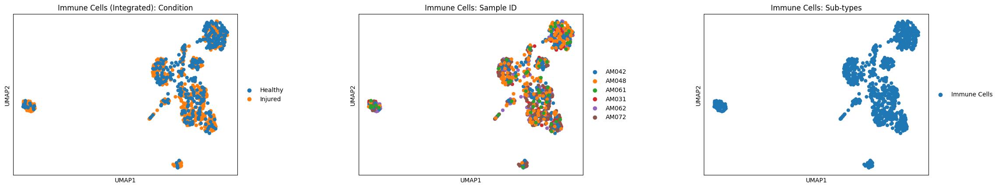

In [24]:
import scanpy as sc
import harmonypy
import numpy as np

# Assuming 'broad_cell_type', 'condition', and 'detailed_cell_type'
# are already set up in adata.obs from the previous steps.
broad_categories = adata.obs["broad_cell_type"].dropna().unique()

for cell_type in broad_categories:
    print(f"--- Reclustering and Integrating {cell_type} ---")

    # 1. Create a true copy of the subset
    subset_adata = adata[adata.obs["broad_cell_type"] == cell_type].copy()

    # CRITICAL FIX 1: Drop empty categories!
    # If a sample has 0 cells of this type, we must wipe it from the metadata so Harmony doesn't divide by zero.
    if subset_adata.obs["sample_id"].dtype.name == "category":
        subset_adata.obs["sample_id"] = subset_adata.obs[
            "sample_id"
        ].cat.remove_unused_categories()
    else:
        subset_adata.obs["sample_id"] = subset_adata.obs["sample_id"].astype("category")

    # 2. Recalculate HVGs
    # Wrapped in a try/except because if a cell type has too few cells in a specific batch,
    # the batch_key computation can fail. This falls back to global HVGs if necessary.
    try:
        sc.pp.highly_variable_genes(
            subset_adata,
            min_mean=0.0125,
            max_mean=3,
            min_disp=0.5,
            batch_key="sample_id",
        )
    except ValueError:
        print(
            f"  -> Not enough cells across batches for {cell_type}. Falling back to standard HVGs."
        )
        sc.pp.highly_variable_genes(
            subset_adata, min_mean=0.0125, max_mean=3, min_disp=0.5
        )

    # CRITICAL FIX 2: Do NOT slice the adata. Use the use_highly_variable flag instead.
    # 3. Recompute PCA
    sc.tl.pca(subset_adata, svd_solver="arpack", use_highly_variable=True)

    # 4. Run Harmony Integration directly via harmonypy to avoid scanpy's transposition bug.
    # Z_corr is stored as (n_PCs × n_cells), so we transpose to (n_cells × n_PCs) for obsm.
    print(f"  -> Running Harmony for {cell_type}...")
    harmony_out = harmonypy.run_harmony(
        subset_adata.obsm["X_pca"].astype(np.float64), subset_adata.obs, "sample_id"
    )
    corrected = harmony_out.Z_corr.T

    # CRITICAL FIX 3: Guard against double-transposition across harmonypy versions.
    # If Z_corr was already (n_cells × n_PCs), .T gives (n_PCs, n_cells) — catch and flip back.
    if corrected.shape[0] != subset_adata.n_obs:
        print(
            f"  -> Detected transposed Z_corr (shape {corrected.shape}), correcting..."
        )
        corrected = corrected.T
    assert corrected.shape[0] == subset_adata.n_obs, (
        f"Harmony output shape {corrected.shape} still doesn't match n_obs={subset_adata.n_obs}"
    )
    subset_adata.obsm["X_pca_harmony"] = corrected

    # 5. Recompute the neighborhood graph using the HARMONY-corrected PCA
    sc.pp.neighbors(subset_adata, use_rep="X_pca_harmony", n_neighbors=10, n_pcs=30)
    sc.tl.umap(subset_adata)

    # 6. Plot the newly integrated UMAP
    sc.pl.umap(
        subset_adata,
        color=["condition", "sample_id", "detailed_cell_type"],
        title=[
            f"{cell_type} (Integrated): Condition",
            f"{cell_type}: Sample ID",
            f"{cell_type}: Sub-types",
        ],
        wspace=0.4,
        show=True,
    )


# Batch correcting everything, but using condition as a covariate

When several covariates are specified, lambda can be a vector of equal length to the number of variables, assigning each covariate its own penalty scalar. CRAN Setting lamb=10.0 on Condition makes Harmony highly resistant to collapsing Normal/Disease differences, while lamb=1.0 on sample_id applies standard batch correction between donors.
This is an imperfect proxy for a true "protect this variable" flag — you're turning a dial rather than flipping a switch — but it's what the Python API actually supports and it's a reasonable approach. Here's the full updated loop:

--- Reclustering and Integrating Hepatocyte ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:01:04,168 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:01:04,174 - harmonypy - INFO -   Parameters:
2026-03-09 13:01:04,178 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:01:04,182 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:01:04,186 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:01:04,190 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:01:04,194 - harmonypy - INFO -     nclust: 100
2026-03-09 13:01:04,195 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:01:04,196 - harmonypy - INFO -     lamb

  -> Running Harmony for Hepatocyte...


2026-03-09 13:01:04,460 - harmonypy - INFO - KMeans initialization complete.
2026-03-09 13:01:04,470 - harmonypy - INFO - Iteration 1 of 10
2026-03-09 13:01:05,082 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 13:01:06,001 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 13:01:06,621 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 13:01:07,050 - harmonypy - INFO - Converged after 4 iterations


  -> Detected transposed Z_corr (shape (50, 19122)), correcting...


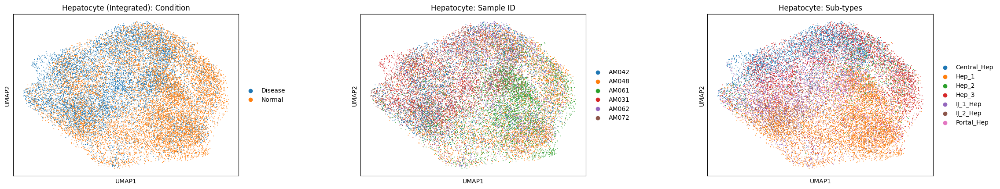

--- Reclustering and Integrating HSC ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:01:16,117 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:01:16,122 - harmonypy - INFO -   Parameters:
2026-03-09 13:01:16,130 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:01:16,138 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:01:16,146 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:01:16,154 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:01:16,162 - harmonypy - INFO -     nclust: 81
2026-03-09 13:01:16,163 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:01:16,164 - harmonypy - INFO -     lamb:

  -> Running Harmony for HSC...


2026-03-09 13:01:16,325 - harmonypy - INFO - KMeans initialization complete.
2026-03-09 13:01:16,339 - harmonypy - INFO - Iteration 1 of 10
2026-03-09 13:01:17,155 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 13:01:17,612 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 13:01:17,986 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 13:01:18,308 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 13:01:18,627 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 13:01:18,966 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 13:01:19,208 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 13:01:19,448 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 13:01:19,712 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 13:01:19,932 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 2418)), correcting...


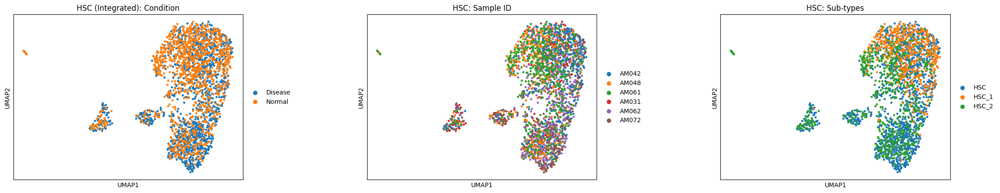

--- Reclustering and Integrating LSEC ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:01:24,004 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:01:24,005 - harmonypy - INFO -   Parameters:
2026-03-09 13:01:24,006 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:01:24,010 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:01:24,010 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:01:24,010 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:01:24,010 - harmonypy - INFO -     nclust: 87
2026-03-09 13:01:24,011 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:01:24,011 - harmonypy - INFO -     lamb:

  -> Running Harmony for LSEC...


2026-03-09 13:01:24,453 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 13:01:24,630 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 13:01:24,833 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 13:01:25,167 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 13:01:25,482 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 13:01:25,791 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 13:01:26,442 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 13:01:27,097 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 13:01:27,549 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 13:01:27,793 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 2620)), correcting...


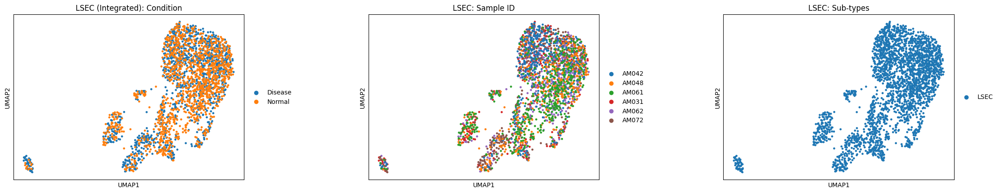

--- Reclustering and Integrating Macrophage ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:01:31,413 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:01:31,415 - harmonypy - INFO -   Parameters:
2026-03-09 13:01:31,418 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:01:31,421 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:01:31,422 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:01:31,422 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:01:31,422 - harmonypy - INFO -     nclust: 56
2026-03-09 13:01:31,423 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:01:31,423 - harmonypy - INFO -     lamb:

  -> Running Harmony for Macrophage...


2026-03-09 13:01:32,277 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 13:01:32,765 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 13:01:33,025 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 13:01:33,286 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 13:01:33,540 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 13:01:33,722 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 13:01:33,906 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 13:01:34,079 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 13:01:34,250 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 13:01:34,415 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 1690)), correcting...


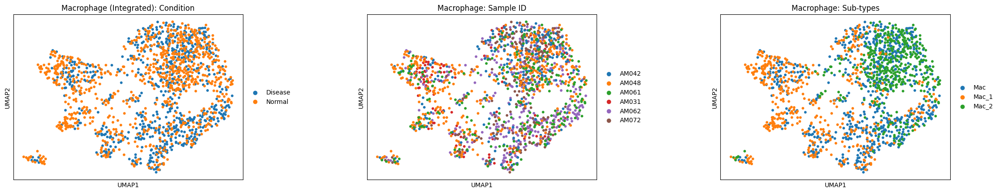

--- Reclustering and Integrating Cholangiocyte ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:01:36,958 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:01:36,959 - harmonypy - INFO -   Parameters:
2026-03-09 13:01:36,960 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:01:36,960 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:01:36,960 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:01:36,961 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:01:36,961 - harmonypy - INFO -     nclust: 33
2026-03-09 13:01:36,961 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:01:36,962 - harmonypy - INFO -     lamb:

  -> Running Harmony for Cholangiocyte...


2026-03-09 13:01:37,681 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 13:01:38,259 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 13:01:38,817 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 13:01:39,057 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 13:01:39,332 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 13:01:39,518 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 13:01:39,659 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 13:01:39,824 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 13:01:39,968 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 13:01:40,123 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 987)), correcting...


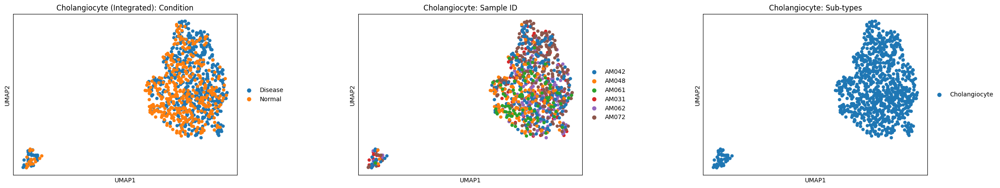

--- Reclustering and Integrating Immune Cells ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:01:41,963 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:01:41,963 - harmonypy - INFO -   Parameters:
2026-03-09 13:01:41,964 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:01:41,964 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:01:41,965 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:01:41,965 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:01:41,965 - harmonypy - INFO -     nclust: 28
2026-03-09 13:01:41,965 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:01:41,966 - harmonypy - INFO -     lamb:

  -> Running Harmony for Immune Cells...


2026-03-09 13:01:42,425 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 13:01:42,625 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 13:01:42,803 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 13:01:42,925 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 13:01:43,061 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 13:01:43,157 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 13:01:43,253 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 13:01:43,349 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 13:01:43,458 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 13:01:43,564 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 855)), correcting...


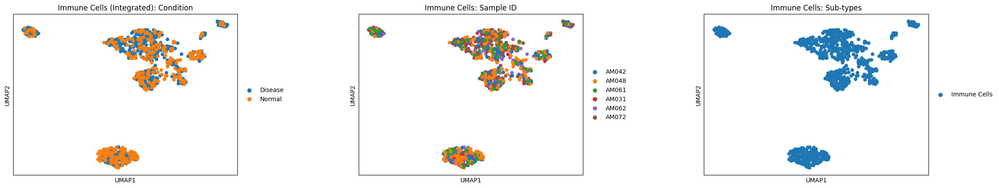

In [29]:
import scanpy as sc
import harmonypy
import numpy as np

broad_categories = adata.obs["broad_cell_type"].dropna().unique()

for cell_type in broad_categories:
    print(f"--- Reclustering and Integrating {cell_type} ---")

    # 1. Create a true copy of the subset
    subset_adata = adata[adata.obs["broad_cell_type"] == cell_type].copy()

    # CRITICAL FIX 1: Drop empty categories for both batch variables
    for col in ["sample_id", "Condition"]:
        if subset_adata.obs[col].dtype.name == "category":
            subset_adata.obs[col] = subset_adata.obs[col].cat.remove_unused_categories()
        else:
            subset_adata.obs[col] = subset_adata.obs[col].astype("category")

    # 2. Recalculate HVGs
    try:
        sc.pp.highly_variable_genes(
            subset_adata,
            min_mean=0.0125,
            max_mean=3,
            min_disp=0.5,
            batch_key="sample_id",
        )
    except ValueError:
        print(
            f"  -> Not enough cells across batches for {cell_type}. Falling back to standard HVGs."
        )
        sc.pp.highly_variable_genes(
            subset_adata, min_mean=0.0125, max_mean=3, min_disp=0.5
        )

    # 3. Recompute PCA
    sc.tl.pca(subset_adata, svd_solver="arpack", use_highly_variable=True)

    # 4. Run Harmony correcting for sample_id, with a high lambda on Condition
    #    to strongly resist collapsing Normal vs Disease differences.
    #    lamb=[1.0, 10.0] -> standard correction for sample, heavy penalty against
    #    correcting Condition. This is the closest harmonypy gets to "protect covariate".
    print(f"  -> Running Harmony for {cell_type}...")
    harmony_out = harmonypy.run_harmony(
        subset_adata.obsm["X_pca"].astype(np.float64),
        subset_adata.obs,
        vars_use=["sample_id", "Condition"],
        lamb=[1.0, 10.0],
    )

    corrected = harmony_out.Z_corr.T

    # CRITICAL FIX 3: Guard against double-transposition across harmonypy versions
    if corrected.shape[0] != subset_adata.n_obs:
        print(
            f"  -> Detected transposed Z_corr (shape {corrected.shape}), correcting..."
        )
        corrected = corrected.T
    assert corrected.shape[0] == subset_adata.n_obs, (
        f"Harmony output shape {corrected.shape} still doesn't match n_obs={subset_adata.n_obs}"
    )
    subset_adata.obsm["X_pca_harmony"] = corrected

    # 5. Recompute the neighborhood graph
    sc.pp.neighbors(subset_adata, use_rep="X_pca_harmony", n_neighbors=10, n_pcs=30)
    sc.tl.umap(subset_adata)

    # 6. Plot
    sc.pl.umap(
        subset_adata,
        color=["Condition", "sample_id", "detailed_cell_type"],
        title=[
            f"{cell_type} (Integrated): Condition",
            f"{cell_type}: Sample ID",
            f"{cell_type}: Sub-types",
        ],
        wspace=0.4,
        show=True,
    )


# Only batch correcting the healthy samples below:

--- Reclustering and Integrating Hepatocyte ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


  -> 10019 Normal cells, 9103 Disease cells


2026-03-09 12:55:26,604 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:55:26,605 - harmonypy - INFO -   Parameters:
2026-03-09 12:55:26,605 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:55:26,605 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:55:26,606 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:55:26,606 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:55:26,606 - harmonypy - INFO -     nclust: 100
2026-03-09 12:55:26,606 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:55:26,607 - harmonypy - INFO -     lamb: [1. 1. 1.]
2026-03-09 12:55:26,607 - harmonypy - INFO -     theta: [2. 2. 2.]
2026-03-09 12:55:26,608 - harmonypy - INFO -     sigma: [0.1 0.1 0.1 0.1 0.1]...
2026-03-09 12:55:26,608 - harmonypy - INFO -     verbose: True
2026-03-09 12:55:26,608 - harmonypy - INFO -     random_state: 0
2026-03-09 12:55:26,608 - harmonypy - INFO -   Data: 50 PCs × 10019 cells
2026-03-09 12:55:26,609 - harmonypy

  -> Running Harmony on Normal cells for Hepatocyte...


2026-03-09 12:55:26,807 - harmonypy - INFO - KMeans initialization complete.
2026-03-09 12:55:26,815 - harmonypy - INFO - Iteration 1 of 10
2026-03-09 12:55:27,290 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:55:27,761 - harmonypy - INFO - Converged after 2 iterations


  -> Detected transposed Z_corr (shape (50, 10019)), correcting...


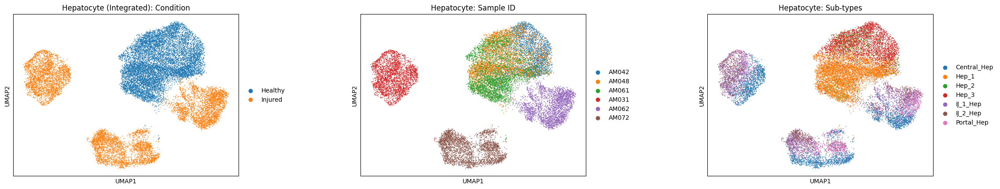

--- Reclustering and Integrating HSC ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:55:37,210 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:55:37,211 - harmonypy - INFO -   Parameters:
2026-03-09 12:55:37,211 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:55:37,212 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:55:37,212 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:55:37,212 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:55:37,212 - harmonypy - INFO -     nclust: 39
2026-03-09 12:55:37,213 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:55:37,214 - harmonypy - INFO -     lamb:

  -> 1164 Normal cells, 1254 Disease cells
  -> Running Harmony on Normal cells for HSC...


2026-03-09 12:55:37,414 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:55:37,646 - harmonypy - INFO - Converged after 2 iterations


  -> Detected transposed Z_corr (shape (50, 1164)), correcting...


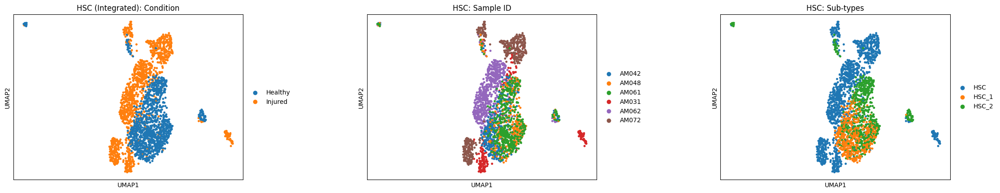

--- Reclustering and Integrating LSEC ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:55:41,671 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:55:41,672 - harmonypy - INFO -   Parameters:
2026-03-09 12:55:41,673 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:55:41,673 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:55:41,673 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:55:41,673 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:55:41,674 - harmonypy - INFO -     nclust: 45
2026-03-09 12:55:41,674 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:55:41,675 - harmonypy - INFO -     lamb:

  -> 1341 Normal cells, 1279 Disease cells
  -> Running Harmony on Normal cells for LSEC...


2026-03-09 12:55:41,698 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-03-09 12:55:41,749 - harmonypy - INFO - KMeans initialization complete.
2026-03-09 12:55:41,760 - harmonypy - INFO - Iteration 1 of 10
2026-03-09 12:55:42,073 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:55:42,385 - harmonypy - INFO - Converged after 2 iterations


  -> Detected transposed Z_corr (shape (50, 1341)), correcting...


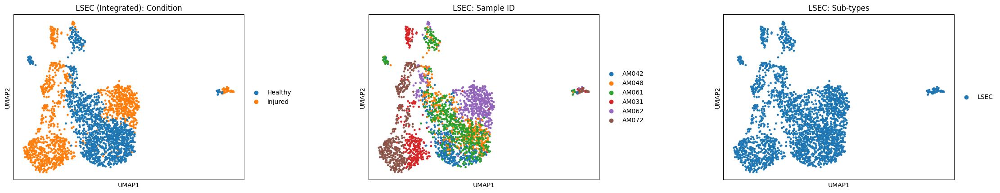

--- Reclustering and Integrating Macrophage ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:55:45,937 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:55:45,937 - harmonypy - INFO -   Parameters:
2026-03-09 12:55:45,938 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:55:45,938 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:55:45,938 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:55:45,939 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:55:45,939 - harmonypy - INFO -     nclust: 31
2026-03-09 12:55:45,939 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:55:45,939 - harmonypy - INFO -     lamb:

  -> 924 Normal cells, 766 Disease cells
  -> Running Harmony on Normal cells for Macrophage...


2026-03-09 12:55:46,260 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:55:46,393 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 12:55:46,512 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 12:55:46,587 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 12:55:46,672 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 12:55:46,725 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 12:55:46,776 - harmonypy - INFO - Iteration 8 of 10
2026-03-09 12:55:46,834 - harmonypy - INFO - Iteration 9 of 10
2026-03-09 12:55:46,908 - harmonypy - INFO - Iteration 10 of 10
2026-03-09 12:55:46,966 - harmonypy - INFO - Stopped before convergence


  -> Detected transposed Z_corr (shape (50, 924)), correcting...


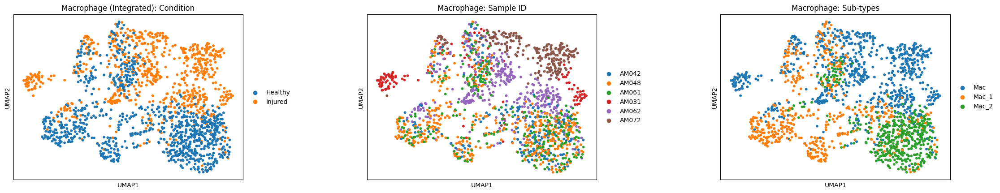

--- Reclustering and Integrating Cholangiocyte ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:55:49,846 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:55:49,847 - harmonypy - INFO -   Parameters:
2026-03-09 12:55:49,847 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:55:49,848 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:55:49,848 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:55:49,848 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:55:49,849 - harmonypy - INFO -     nclust: 14
2026-03-09 12:55:49,849 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:55:49,849 - harmonypy - INFO -     lamb:

  -> 415 Normal cells, 572 Disease cells
  -> Running Harmony on Normal cells for Cholangiocyte...


2026-03-09 12:55:50,181 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:55:50,337 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 12:55:50,453 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 12:55:50,568 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 12:55:50,629 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 12:55:50,706 - harmonypy - INFO - Converged after 6 iterations


  -> Detected transposed Z_corr (shape (50, 415)), correcting...


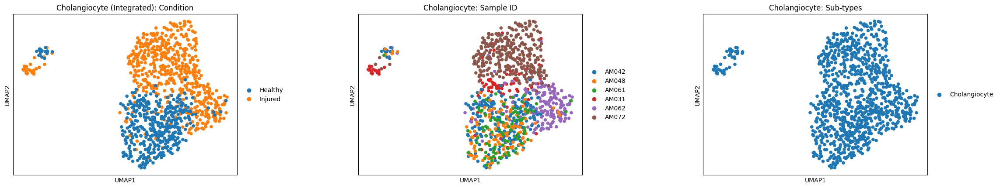

--- Reclustering and Integrating Immune Cells ---


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 12:55:52,753 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 12:55:52,754 - harmonypy - INFO -   Parameters:
2026-03-09 12:55:52,754 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 12:55:52,755 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 12:55:52,755 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 12:55:52,755 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 12:55:52,756 - harmonypy - INFO -     nclust: 12
2026-03-09 12:55:52,756 - harmonypy - INFO -     block_size: 0.05
2026-03-09 12:55:52,756 - harmonypy - INFO -     lamb:

  -> 351 Normal cells, 504 Disease cells
  -> Running Harmony on Normal cells for Immune Cells...


2026-03-09 12:55:52,957 - harmonypy - INFO - Iteration 2 of 10
2026-03-09 12:55:53,091 - harmonypy - INFO - Iteration 3 of 10
2026-03-09 12:55:53,171 - harmonypy - INFO - Iteration 4 of 10
2026-03-09 12:55:53,251 - harmonypy - INFO - Iteration 5 of 10
2026-03-09 12:55:53,333 - harmonypy - INFO - Iteration 6 of 10
2026-03-09 12:55:53,422 - harmonypy - INFO - Iteration 7 of 10
2026-03-09 12:55:53,502 - harmonypy - INFO - Converged after 7 iterations


  -> Detected transposed Z_corr (shape (50, 351)), correcting...


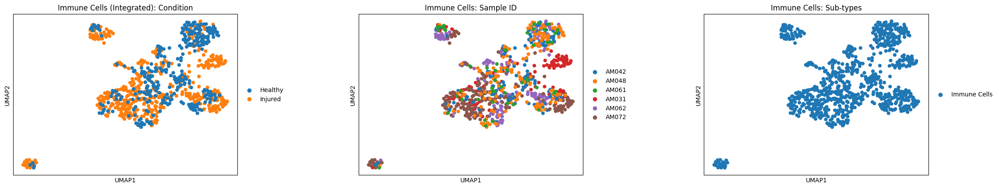

In [27]:
import scanpy as sc
import harmonypy
import numpy as np

NORMAL_SAMPLES = ["AM048", "AM061", "AM042"]
DISEASE_SAMPLES = ["AM062", "AM072", "AM031"]

broad_categories = adata.obs["broad_cell_type"].dropna().unique()

for cell_type in broad_categories:
    print(f"--- Reclustering and Integrating {cell_type} ---")

    # 1. Create a true copy of the subset
    subset_adata = adata[adata.obs["broad_cell_type"] == cell_type].copy()

    # CRITICAL FIX 1: Drop empty categories
    if subset_adata.obs["sample_id"].dtype.name == "category":
        subset_adata.obs["sample_id"] = subset_adata.obs[
            "sample_id"
        ].cat.remove_unused_categories()
    else:
        subset_adata.obs["sample_id"] = subset_adata.obs["sample_id"].astype("category")

    # 2. Recalculate HVGs
    try:
        sc.pp.highly_variable_genes(
            subset_adata,
            min_mean=0.0125,
            max_mean=3,
            min_disp=0.5,
            batch_key="sample_id",
        )
    except ValueError:
        print(
            f"  -> Not enough cells across batches for {cell_type}. Falling back to standard HVGs."
        )
        sc.pp.highly_variable_genes(
            subset_adata, min_mean=0.0125, max_mean=3, min_disp=0.5
        )

    # CRITICAL FIX 2: Do NOT slice the adata. Use the use_highly_variable flag instead.
    # 3. Recompute PCA on the full subset (Normal + Disease together)
    sc.tl.pca(subset_adata, svd_solver="arpack", use_highly_variable=True)

    # 4. Split into Normal and Disease masks
    normal_mask = subset_adata.obs["sample_id"].isin(NORMAL_SAMPLES)
    disease_mask = subset_adata.obs["sample_id"].isin(DISEASE_SAMPLES)

    print(f"  -> {normal_mask.sum()} Normal cells, {disease_mask.sum()} Disease cells")

    # 5. Run Harmony ONLY on Normal cells to correct for donor technical variation.
    #    Disease cells are left in un-corrected PCA space — their biological
    #    differences across fibrosis stages are assumed to be real signal.
    normal_adata = subset_adata[normal_mask].copy()
    if normal_adata.obs["sample_id"].dtype.name == "category":
        normal_adata.obs["sample_id"] = normal_adata.obs[
            "sample_id"
        ].cat.remove_unused_categories()

    print(f"  -> Running Harmony on Normal cells for {cell_type}...")
    harmony_out = harmonypy.run_harmony(
        normal_adata.obsm["X_pca"].astype(np.float64),
        normal_adata.obs,
        "sample_id",
    )
    corrected_normal = harmony_out.Z_corr.T

    # CRITICAL FIX 3: Guard against double-transposition across harmonypy versions
    if corrected_normal.shape[0] != normal_adata.n_obs:
        print(
            f"  -> Detected transposed Z_corr (shape {corrected_normal.shape}), correcting..."
        )
        corrected_normal = corrected_normal.T
    assert corrected_normal.shape[0] == normal_adata.n_obs, (
        f"Harmony output shape {corrected_normal.shape} still doesn't match "
        f"n_obs={normal_adata.n_obs}"
    )

    # 6. Build a unified corrected embedding array for ALL cells, preserving original
    #    cell order. Normal cells get Harmony-corrected coords; Disease cells keep
    #    their raw PCA coords so their biology is not artificially collapsed.
    n_pcs = subset_adata.obsm["X_pca"].shape[1]
    corrected_all = np.zeros((subset_adata.n_obs, n_pcs), dtype=np.float64)
    corrected_all[normal_mask.values] = corrected_normal
    corrected_all[disease_mask.values] = subset_adata.obsm["X_pca"][disease_mask.values]
    subset_adata.obsm["X_pca_harmony"] = corrected_all

    # 7. Recompute the neighborhood graph using the combined embedding
    sc.pp.neighbors(subset_adata, use_rep="X_pca_harmony", n_neighbors=10, n_pcs=30)
    sc.tl.umap(subset_adata)

    # 8. Plot the newly integrated UMAP
    sc.pl.umap(
        subset_adata,
        color=["condition", "sample_id", "detailed_cell_type"],
        title=[
            f"{cell_type} (Integrated): Condition",
            f"{cell_type}: Sample ID",
            f"{cell_type}: Sub-types",
        ],
        wspace=0.4,
        show=True,
    )



--- Processing Hepatocyte ---
  -> Integrating Normal Hepatocytes...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:02:45,802 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:02:45,806 - harmonypy - INFO -   Parameters:
2026-03-09 13:02:45,806 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:02:45,806 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:02:45,807 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:02:45,807 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:02:45,807 - harmonypy - INFO -     nclust: 100
2026-03-09 13:02:45,808 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:02:45,808 - harmonypy - INFO -     lamb

  -> Computing Disease Hepatocyte trajectory (No Integration)...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


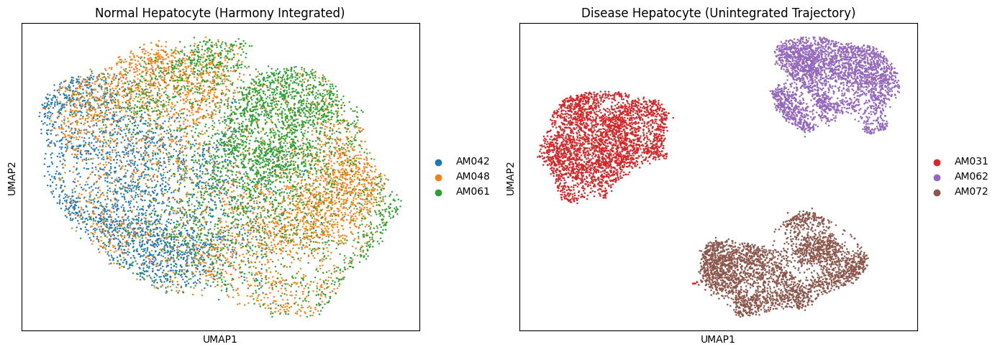


--- Processing HSC ---
  -> Integrating Normal HSCs...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:03:02,361 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:03:02,366 - harmonypy - INFO -   Parameters:
2026-03-09 13:03:02,370 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:03:02,374 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:03:02,382 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:03:02,386 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:03:02,386 - harmonypy - INFO -     nclust: 39
2026-03-09 13:03:02,387 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:03:02,387 - harmonypy - INFO -     lamb:

  -> Computing Disease HSC trajectory (No Integration)...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


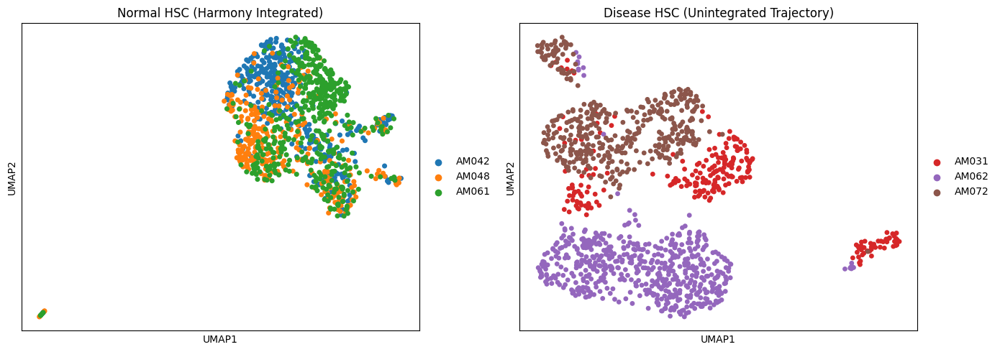


--- Processing LSEC ---
  -> Integrating Normal LSECs...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:03:07,802 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:03:07,803 - harmonypy - INFO -   Parameters:
2026-03-09 13:03:07,804 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:03:07,804 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:03:07,804 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:03:07,804 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:03:07,805 - harmonypy - INFO -     nclust: 45
2026-03-09 13:03:07,805 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:03:07,805 - harmonypy - INFO -     lamb:

  -> Computing Disease LSEC trajectory (No Integration)...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


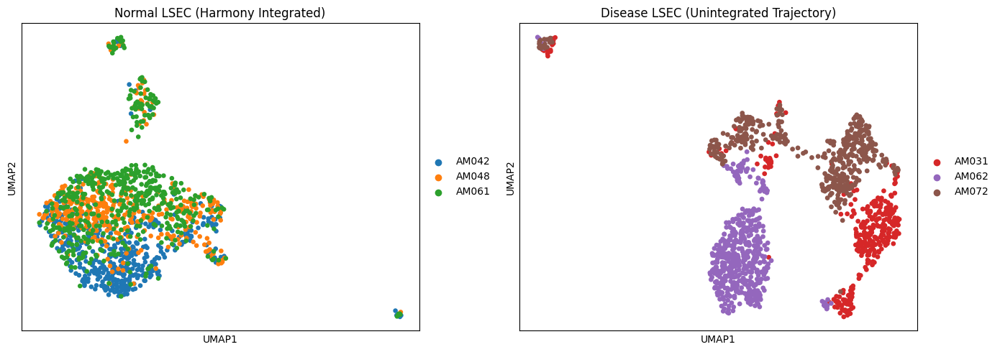


--- Processing Macrophage ---
  -> Integrating Normal Macrophages...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:03:12,744 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:03:12,744 - harmonypy - INFO -   Parameters:
2026-03-09 13:03:12,745 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:03:12,745 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:03:12,745 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:03:12,746 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:03:12,746 - harmonypy - INFO -     nclust: 31
2026-03-09 13:03:12,746 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:03:12,746 - harmonypy - INFO -     lamb:

  -> Computing Disease Macrophage trajectory (No Integration)...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


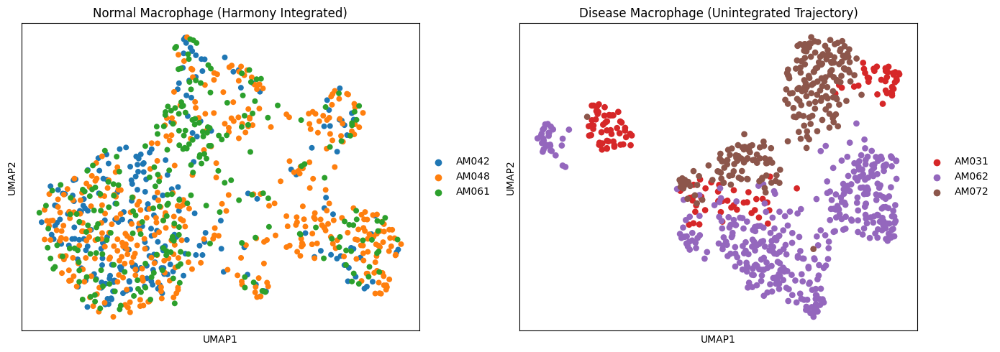


--- Processing Cholangiocyte ---
  -> Integrating Normal Cholangiocytes...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:03:17,356 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:03:17,358 - harmonypy - INFO -   Parameters:
2026-03-09 13:03:17,358 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:03:17,359 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:03:17,359 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:03:17,360 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:03:17,360 - harmonypy - INFO -     nclust: 14
2026-03-09 13:03:17,360 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:03:17,361 - harmonypy - INFO -     lamb:

  -> Computing Disease Cholangiocyte trajectory (No Integration)...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


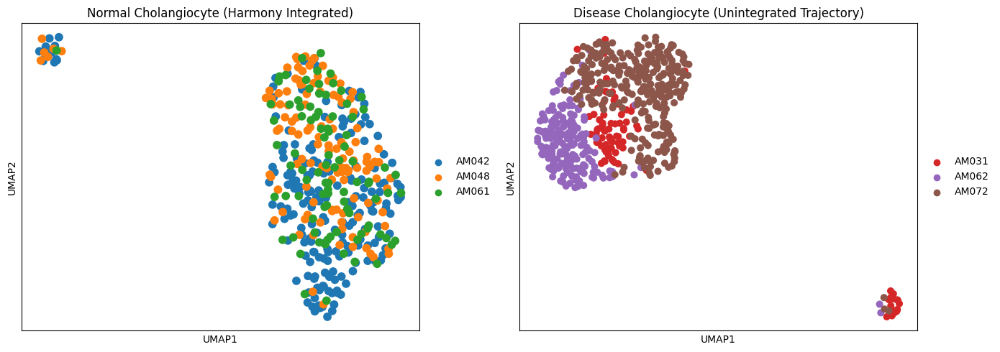


--- Processing Immune Cells ---
  -> Integrating Normal Immune Cellss...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(
2026-03-09 13:03:20,188 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-09 13:03:20,189 - harmonypy - INFO -   Parameters:
2026-03-09 13:03:20,190 - harmonypy - INFO -     max_iter_harmony: 10
2026-03-09 13:03:20,190 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-09 13:03:20,190 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-09 13:03:20,191 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-09 13:03:20,191 - harmonypy - INFO -     nclust: 12
2026-03-09 13:03:20,191 - harmonypy - INFO -     block_size: 0.05
2026-03-09 13:03:20,191 - harmonypy - INFO -     lamb:

  -> Computing Disease Immune Cells trajectory (No Integration)...


/mnt/home/bowmand8/.conda/envs/scVIDR_Refactor/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:226: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  mask_var_param, mask_var = _handle_mask_var(


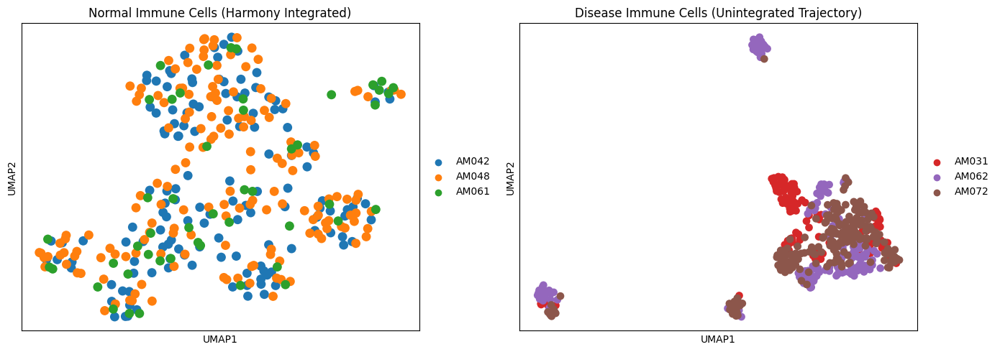

In [30]:
import scanpy as sc
import harmonypy
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'broad_cell_type' is set up
broad_categories = adata.obs["broad_cell_type"].dropna().unique()

for cell_type in broad_categories:
    print(f"\n--- Processing {cell_type} ---")

    # 1. Isolate the cell type
    subset_adata = adata[adata.obs["broad_cell_type"] == cell_type].copy()

    # 2. Split into Normal and Disease manifolds based on your Condition column
    normal_adata = subset_adata[subset_adata.obs["Condition"] == "Normal"].copy()
    disease_adata = subset_adata[subset_adata.obs["Condition"] == "Disease"].copy()

    # --- PROCESS NORMAL (WITH HARMONY) ---
    print(f"  -> Integrating Normal {cell_type}s...")

    # Clean up empty categories so Harmony doesn't crash
    if normal_adata.obs["sample_id"].dtype.name == "category":
        normal_adata.obs["sample_id"] = normal_adata.obs[
            "sample_id"
        ].cat.remove_unused_categories()

    sc.pp.highly_variable_genes(
        normal_adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key="sample_id"
    )
    sc.tl.pca(normal_adata, svd_solver="arpack", use_highly_variable=True)

    # Run Harmony and protect against the double-transposition bug
    ho = harmonypy.run_harmony(
        normal_adata.obsm["X_pca"].astype(np.float64), normal_adata.obs, "sample_id"
    )
    corrected = ho.Z_corr.T
    if corrected.shape[0] != normal_adata.n_obs:
        corrected = corrected.T
    normal_adata.obsm["X_pca_harmony"] = corrected

    sc.pp.neighbors(normal_adata, use_rep="X_pca_harmony", n_neighbors=10, n_pcs=30)
    sc.tl.umap(normal_adata)

    # --- PROCESS DISEASE (NO HARMONY) ---
    print(f"  -> Computing Disease {cell_type} trajectory (No Integration)...")

    if disease_adata.obs["sample_id"].dtype.name == "category":
        disease_adata.obs["sample_id"] = disease_adata.obs[
            "sample_id"
        ].cat.remove_unused_categories()

    # Standard PCA pipeline for Disease to preserve the fibrosis stage variance
    sc.pp.highly_variable_genes(
        disease_adata, min_mean=0.0125, max_mean=3, min_disp=0.5
    )
    sc.tl.pca(disease_adata, svd_solver="arpack", use_highly_variable=True)
    sc.pp.neighbors(
        disease_adata, n_neighbors=10, n_pcs=30
    )  # Note: Uses standard X_pca!
    sc.tl.umap(disease_adata)

    # --- PLOTTING ---
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    sc.pl.umap(
        normal_adata,
        color="sample_id",
        title=f"Normal {cell_type} (Harmony Integrated)",
        ax=axes[0],
        show=False,
    )
    sc.pl.umap(
        disease_adata,
        color="sample_id",
        title=f"Disease {cell_type} (Unintegrated Trajectory)",
        ax=axes[1],
        show=False,
    )

    plt.tight_layout()
    plt.show()
